In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import cv2
import torch
import torchvision
import torchvision.transforms as transforms
import pytorch_lightning as pl
import torch.nn as nn
import torch.nn.functional as F
from torchmetrics.classification import Accuracy
import torch.optim as optim
from pytorch_lightning.callbacks import ModelCheckpoint
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Disclaimer
This cheatsheet is for people who already have some ML/DL experience as it does not explain the concepts in detail. It is meant to be a quick reference guide for the most common operations in PyTorch. Code that are self-descriptive will not be elaborated on.

> Idhibhat Pankam 6532203021

In [ ]:
# check device if gpu (cuda) is available
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

## Pytorch classes

### Dataset

In [ ]:
class Dataset(torch.utils.data.Dataset):
    def __init__(self):
        super().__init__()
        # do anything to load your data here, e.g. download, read from disk, etc.
        # e.g. out into self.data

    def __getitem__(self, idx):
        # get the idx-th item of your data
        x, y = self.data[idx]
        return x,y

### Model

In [ ]:
class Model(pl.LightningModule):
    def __init__(self):
        super(Model, self).__init__()
        # declare the layers/activation fn/loss fn for your neural network
    
    def forward(self, x):
        # forward pass
        # do a non-linearity after CNN before pooling
        return x

    def training_step(self, batch, batch_idx):
        # get x, y from batch (depends on how you created the batch in dataloader)
        logits = self(x) # self(x) is same as self.forward(x)
        loss = self.criterion(logits, y)
        return loss

    def validation_step(self, batch, batch_idx):
        # practically same as training_step, but pytorch automatically does torch.no_grad() for you
        pass

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=1e-3)

# Image classification: CNN 

#### Model
- 2 CNNs with max poolings -> 3 fully connected layers -> softmax
- Adam optimizer, lr=1e-3

#### Dataset
- 60k images of 10 classes ('plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck')
- 40k training, 10k validation, 10k test

#### Input
a batch (size 32) of 3-channel images of size 32x32

#### Output
a batch (size 32) of class scores (10 classes) for each image

#### Metrics
- accuracy
- loss: cross-entropy loss

## Process
- get dataset from `torchvision.datasets.CIFAR10`
- create train/val/test loader with `torch.utils.data.DataLoader`
- create `class CNN(pl.LightningModule)`
- create `pl.Trainer` and train (save checkpoint)
- load checkpoint, freeze weights and test

## Results
after 1 epoch:
- train loss: 2.2, acc: 0.242
- val loss: 2.16, acc: 0.286
- test loss: 2.158, acc: 0.288
### macro avg
- precision: 0.2577
- recall: 0.2884
- f1: 0.2508

In [ ]:
# prepare image transformation
transform = transforms.Compose(
    [transforms.ToTensor(), # image to tensor --> divide by 255
     transforms.Resize((32, 32))])

# prepare dataset
batch_size = 32
trainvalset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainset, valset = torch.utils.data.random_split(trainvalset, [40000, 10000])

trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=False)

In [ ]:
class CNN(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 6, 5) # 3 input channels, 6 output channels, 5*5 kernel size
        self.pool = nn.MaxPool2d(2, 2) # 2*2 kernel size, 2 strides
        self.conv2 = nn.Conv2d(6, 16, 5)
        self.fc1 = nn.Linear(400, 120) # dense input 400 (16*5), output 120

        self.fc2 = nn.Linear(120, 84) # dense input 120, output 84
        self.fc3 = nn.Linear(84, 10) # dense input 84, output 10
        self.softmax = torch.nn.Softmax(dim=1) # perform softmax at dim[1] (batch,class)

        self.criterion = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=10)
        self.train_loss = []
        self.train_acc = []
        self.val_loss = []
        self.val_acc = []
        self.train_metrics_epoch = []
        self.val_metrics_epoch = []
        self.n_ = 0

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = torch.flatten(x,start_dim=1) # flatten all dimensions (dim[1]) except batch (dim[0])
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        x = self.softmax(x)
        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        acc = self.accuracy(logits.softmax(dim=-1), y)
        self.train_loss.append(loss)
        self.train_acc.append(acc)

        # Log metrics
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log("train_acc", acc, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def on_train_epoch_end(self):
        # Collect epoch metrics
        self.train_metrics_epoch.append({"train_loss": sum(self.train_loss)/len(self.train_loss), "train_acc": sum(self.train_acc)/len(self.train_acc)})
        self.train_loss = []
        self.train_acc = []

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        acc = self.accuracy(logits.softmax(dim=-1), y)
        self.val_loss.append(loss)
        self.val_acc.append(acc)

        # Log metrics
        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log("val_acc", acc, on_step=False, on_epoch=True, prog_bar=True)

    def on_validation_epoch_end(self):
        # Update validation metrics
        self.val_metrics_epoch.append({"val_loss": sum(self.val_loss)/len(self.val_loss), "val_acc": sum(self.val_acc)/len(self.val_acc)})
        self.val_loss = []
        self.val_acc = []

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=1e-3)

net = CNN().to(device)

In [ ]:
from torchinfo import summary as summary_info
# summarizes model architecture
print(summary_info(net, input_size = (32, 3, 32, 32)))

In [ ]:
checkpoint_callback = ModelCheckpoint(
    monitor="val_acc",       # Monitor validation accuracy
    mode="max",              # Save the model with the highest accuracy
    save_top_k=1,            # Save only the best model
    filename="best-acc-{epoch:02d}-{val_acc:.4f}",  # File name format
    verbose=True             # Print messages when saving
)

trainer = pl.Trainer(max_epochs=1, callbacks=[checkpoint_callback])
trainer.fit(net, trainloader, valloader)

In [ ]:
fig, axs = plt.subplots(2, figsize= (6,10))
# loss
axs[0].plot([round(float(entry['train_loss']), 2) for entry in net.train_metrics_epoch], label = 'training')
axs[0].plot([round(float(entry['val_loss']), 2) for entry in net.val_metrics_epoch], label = 'validation')
axs[0].set_title("loss")
axs[0].legend()
# acc
axs[1].plot([round(float(entry['train_acc']), 2) for entry in net.train_metrics_epoch], label = 'training')
axs[1].plot([round(float(entry['val_acc']), 2) for entry in net.val_metrics_epoch], label = 'validation')
axs[1].set_title("acc")
axs[1].legend()

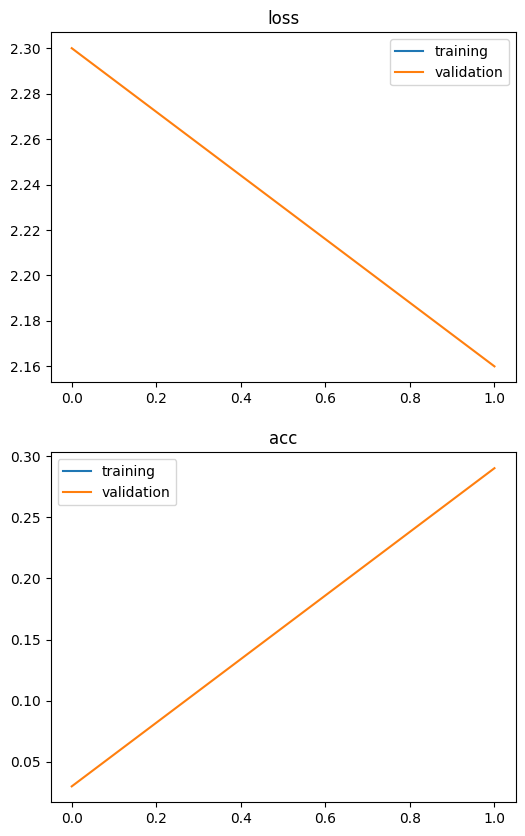

In [ ]:
best_model_path = checkpoint_callback.best_model_path
best_model = CNN.load_from_checkpoint(best_model_path).to(device)

# Use the best model for inference
best_model.eval()
best_model.freeze()

In [ ]:
criterion = nn.CrossEntropyLoss()

print('testing ...')
y_predict = list()
y_labels = list()
test_loss = 0.0
n = 0
with torch.no_grad():
    for data in tqdm(testloader):
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = best_model(inputs)
        loss = criterion(outputs, labels)
        test_loss += loss.item()

        y_labels += list(labels.cpu().numpy())
        y_predict += list(outputs.argmax(dim=1).cpu().numpy())
        n+=1

    # print statistics
    test_loss /= n
    print(f"testing loss: {test_loss:.4}" )

    report = classification_report(y_labels, y_predict, digits = 4)
    M = confusion_matrix(y_labels, y_predict)
    print(report)
    disp = ConfusionMatrixDisplay(confusion_matrix=M)

In [ ]:
disp.plot()
plt.show()

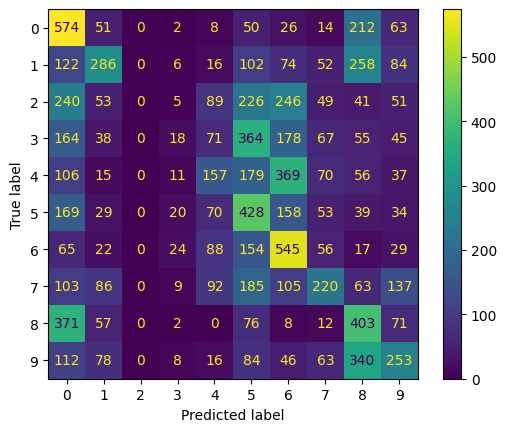

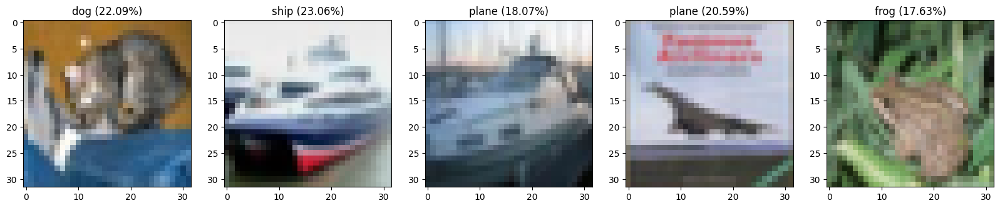

# Image classification: EfficientNetV2

#### Model
- at least 8 CNNs (Conv2dNormActivation, Sequential) -> avg pooling -> dropout -> fully connected layer
- Adam optimizer, lr=1e-3

#### Dataset
- 2000 images of 10 classes ('butterfly', 'cat', 'chicken', 'cow', 'dog', 'elephant', 'horse', 'sheep', 'spider', 'squirrel')
- 1400 training, 300 validation, 300 test

#### Input
a batch (size 32) of 3-channel images of size 32x32

#### Output
a batch (size 32) of class scores (10 classes) for each image

#### Metrics
- accuracy
- loss: cross-entropy loss

## Process
- setup data augmentation with `transforms.Compose`
- create `class AnimalDataset(torch.utils.data.Dataset)`, and put data in `torch.utils.data.DataLoader`
- create `class LitEfficientNetV2(pl.LightningModule)`
- train, save checkpoint, and test like before

## Results
after 5 epochs:
- train loss: 0.338, acc: 0.896
- val loss: 0.649, acc: 0.820
- test loss: 0.610, acc: 0.800
### macro avg
- precision: 0.822
- recall: 0.800
- f1: 0.800

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

# data augmentation to make more data for training
transform_train = transforms.Compose(
    [transforms.Resize((230,230)),
        transforms.RandomRotation(30,),
        transforms.RandomCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.507, 0.487, 0.441], std=[0.267, 0.256, 0.276]) #nomalize imagenet pretrain
    ])

transform = transforms.Compose(
    [transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.507, 0.487, 0.441], std=[0.267, 0.256, 0.276])
    ])

batch_size = 32

In [ ]:
class AnimalDataset(torch.utils.data.Dataset):

    def __init__(self,
                 img_dir,
                 transforms=None):

        super().__init__()
        self.label_image = ['butterfly','cat','chicken','cow','dog','elephant','horse','sheep','spider','squirrel']
        self.input_dataset = list()
        label_num = 0
        for label in self.label_image:
            _, _, files = next(os.walk(os.path.join(img_dir,label)))
            for image_name in files:
                input = [os.path.join(img_dir,label,image_name),label_num] # [image_path, label_num]
                self.input_dataset.append(input)
            label_num += 1

        self.transforms = transforms

    def __len__(self):
        return len(self.input_dataset)

    def __getitem__(self, idx):
        img = Image.open(self.input_dataset[idx][0]).convert('RGB')
        x = self.transforms(img)
        y = self.input_dataset[idx][1]
        return x,y

trainset = AnimalDataset('./Dataset_animal2/train',transform_train)
valset = AnimalDataset('./Dataset_animal2/val',transform)
testset = AnimalDataset('./Dataset_animal2/test',transform)


trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
valloader = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=True)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size, shuffle=True)

In [ ]:
class LitEfficientNetV2(pl.LightningModule):
    def __init__(self, num_classes=10, learning_rate=1e-3):
        super().__init__()
        # Load EfficientNetV2 model from torchvision
        self.model = models.efficientnet_v2_s(weights="IMAGENET1K_V1")
        # Replace the classifier with a custom layer for our task
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)
        self.criterion = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=num_classes)
        self.learning_rate = learning_rate
        self.train_metrics = []
        self.val_metrics = []

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        acc = self.accuracy(logits.softmax(dim=-1), y)
        self.log("train_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log("train_acc", acc, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.criterion(logits, y)
        acc = self.accuracy(logits.softmax(dim=-1), y)
        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log("val_acc", acc, on_step=False, on_epoch=True, prog_bar=True)

    def on_train_epoch_end(self):
        # Collect epoch metrics

        train_loss = self.trainer.callback_metrics["train_loss"]
        train_acc = self.trainer.callback_metrics["train_acc"]
        self.train_metrics.append(
            {
                "epoch": self.current_epoch,
                "train_loss": train_loss.item(),
                "train_acc": train_acc.item(),
            }
        )

    def on_validation_epoch_end(self):
        # Update validation metrics
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_acc = self.trainer.callback_metrics["val_acc"]
        self.val_metrics.append(
            {
                "val_loss": val_loss.item(),
                "val_acc": val_acc.item(),
            }
        )

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer

net = LitEfficientNetV2().to(device)

In [2]:
# checkpoint_callback, train, plot loss/acc code, test, confusion matrix same as before

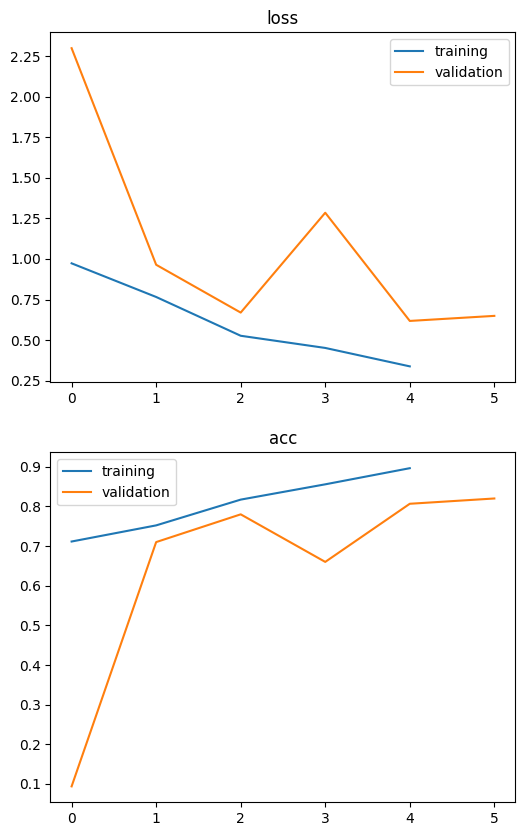

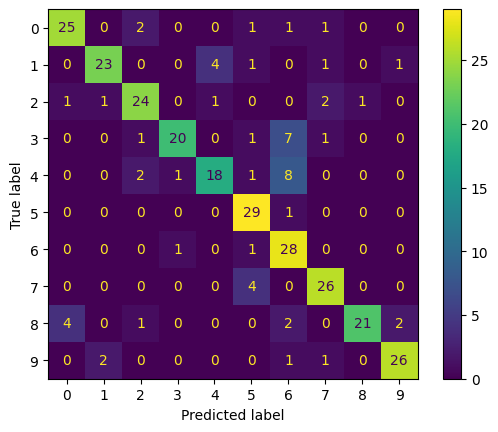

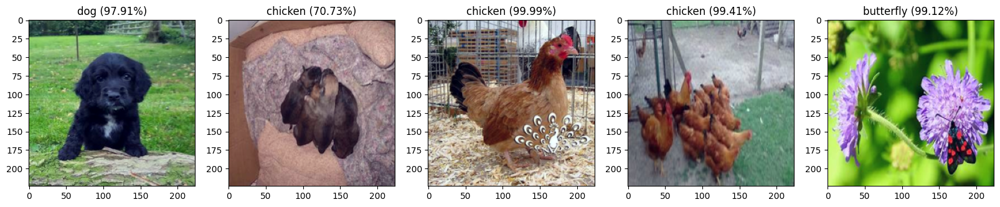

# Object detection with YOLOv8 (basic script)

#### Model
- yolov8n.pt

#### Dataset
- training: [Detect](https://docs.ultralytics.com/tasks/detect/), [Segment](https://docs.ultralytics.com/tasks/segment/), [Classify](https://docs.ultralytics.com/tasks/classify/) and [Pose](https://docs.ultralytics.com/tasks/pose/) datasets
- validation: Pascal-VOC dataset

#### Input
for model use, just the path to image is enough

#### Output
predicted bounding boxes and classes in the image

## Process
- get pre-trained model `model = YOLO('yolov8n.pt')`
- `model.train()` and `model.val()` for training and validation
- `model.predict()` for inference

## Results
see image below

In [ ]:
# ultralytics is for using yolo
%pip install ultralytics
import ultralytics
ultralytics.checks()

# for showing images
from PIL import Image

In [ ]:
!yolo train data=VOC.yaml model=yolov8n.pt epochs=3 imgsz=640 device=0
# you don't even need to write the code or gather the data, just use the yolo command
# no need for Dataset, Dataloader
# trained model will be saved on /content/runs/train

In [ ]:
Image.open("/content/runs/detect/train/results.png")

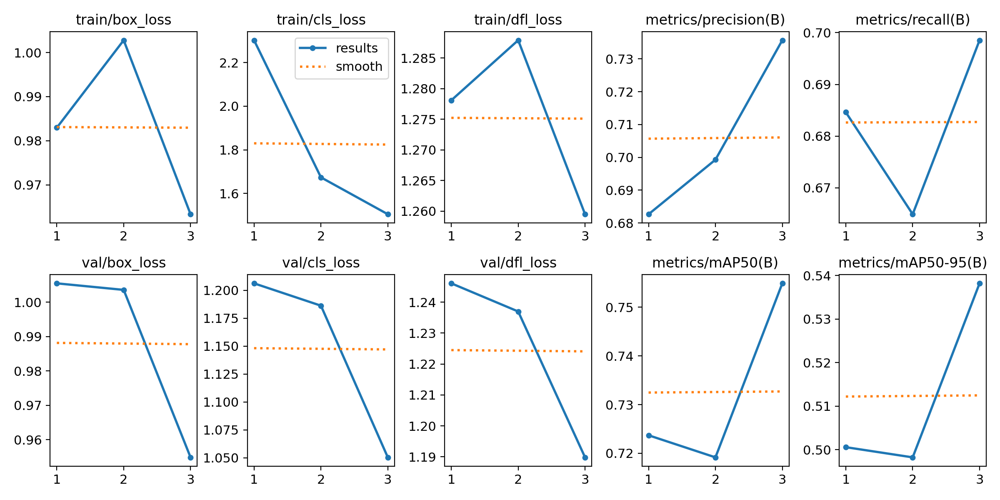

In [ ]:
Image.open("/content/runs/detect/train/val_batch0_pred.jpg")

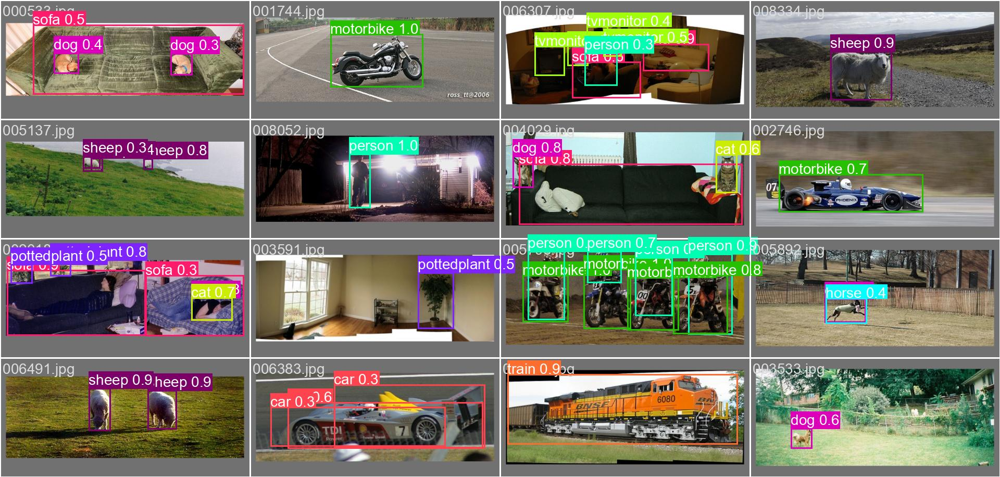

In [ ]:
# Validate "Our model" on VOC val
!yolo val model="/content/runs/detect/train/weights/best.pt" data=VOC.yaml device=0

## Using YOLO with Python

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
model.to('cuda:0') 
results = model.train(data='VOC.yaml', epochs=3)
results = model.val() 

In [ ]:
results = model.predict(source='/content/datasets/VOC/images/test2007/000014.jpg')
results

In [ ]:
# get box coords
x0,y0,x1,y1 = results[0].boxes.xyxy[0].cpu().numpy().astype(int)

# confidence scores for each detected obj
results[0].boxes.conf

# predicted class for each detected obj
results[0].boxes.cls

# class mapping
results[0].names

In [ ]:
conf = results[0].boxes.conf.cpu().numpy()
cls = results[0].boxes.cls.cpu().numpy()
image = results[0].orig_img[:, :, ::-1]
for i in range(len(results[0].boxes)):
  x0,y0,x1,y1 = results[0].boxes.xyxy[i].cpu().numpy().astype(int)
  image = cv2.rectangle(image, (x0, y0), (x1, y1), (20,255,12), 2)
  cv2.putText(image, f"{results[0].names[cls[i]]} {conf[i]:.2f}", (x0, y0-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (20,255,12), 3)
  plt.imshow(image)

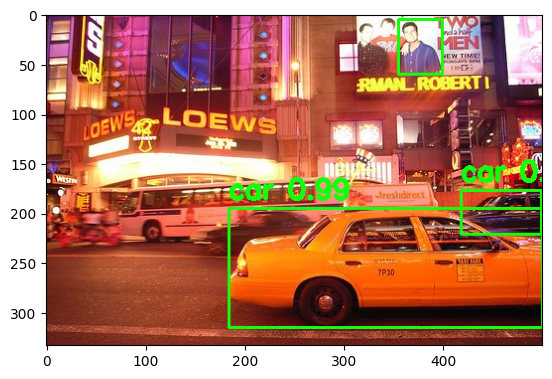

# Object detection with YOLOv8 (custom dataset)

#### Model
- yolov8n.pt

#### Dataset
- Pascal-VOC 2007 (download and preprocess ourselves)

#### Input
for model use, just the path to image is enough

#### Output
predicted bounding boxes and classes in the image

## Process
- download Pascal-VOC 2007 dataset and preprocess
- convert data to YOLO format
- create `data.yaml` to specify dataset and classes
- load and train YOLO model

## Results
see image below

In [ ]:
# Define your class names (must match your dataset)
class_names = ["person", "car", "bus", "train", "cat", "dog", "horse", "cow", "sheep", "aeroplane", "motorbike", "sofa", "tvmonitor", "bottle", "chair", "table", "pottedplant"]

voc_annot_folder = '/content/voc2007/VOCdevkit/VOC2007/Annotations'
image_folder = '/content/voc2007/VOCdevkit/VOC2007/JPEGImages'
yolo_annot_folder = '/content/yolo_annotations'

In [ ]:
os.makedirs(yolo_annot_folder,exist_ok=True)
os.makedirs(os.path.join(yolo_annot_folder,"images"),exist_ok=True)
os.makedirs(os.path.join(yolo_annot_folder,"labels"),exist_ok=True)
# Create lists for images
image_paths = glob(os.path.join(image_folder, "*.jpg"))
image_filenames = [os.path.basename(path) for path in image_paths]

# Process training and validation annotations
train_annot_folder = os.path.join(yolo_annot_folder, "labels", 'train')
val_annot_folder = os.path.join(yolo_annot_folder, "labels" ,'val')

os.makedirs(train_annot_folder,exist_ok=True)
os.makedirs(val_annot_folder,exist_ok=True)

In [ ]:
# Helper function to process annotations
def process_annotations(file_list, annot_folder):
    for image_filename in file_list:
        xml_file = os.path.join(voc_annot_folder, os.path.splitext(image_filename)[0] + '.xml')
        if not os.path.isfile(xml_file):
            continue

        tree = ET.parse(xml_file)
        root = tree.getroot()

        # Get image size
        image_path = os.path.join(image_folder, image_filename)
        image = cv2.imread(image_path)
        h, w, _ = image.shape

        yolo_annot_file = os.path.join(annot_folder, os.path.splitext(image_filename)[0] + '.txt')
        with open(yolo_annot_file, 'w') as f:
            for obj in root.findall('object'):
                cls = obj.find('name').text
                if cls not in class_names:
                    continue
                cls_id = class_names.index(cls)

                xml_box = obj.find('bndbox')
                b = [int(xml_box.find('xmin').text), int(xml_box.find('ymin').text), int(xml_box.find('xmax').text), int(xml_box.find('ymax').text)]

                # Convert to YOLO format
                x_center = (b[0] + b[2]) / 2.0 / w
                y_center = (b[1] + b[3]) / 2.0 / h
                width = (b[2] - b[0]) / w
                height = (b[3] - b[1]) / h

                f.write(f"{cls_id} {x_center} {y_center} {width} {height}\n")


In [ ]:
# Split dataset into training and validation
train_files, val_files = train_test_split(image_filenames, test_size=0.2, random_state=42)

process_annotations(train_files, train_annot_folder)
process_annotations(val_files, val_annot_folder)

# Copy images to respective folders
train_img_folder = os.path.join(yolo_annot_folder, "images", 'train')
val_img_folder = os.path.join(yolo_annot_folder, "images" ,'val')

os.makedirs(train_img_folder,exist_ok=True)
os.makedirs(val_img_folder,exist_ok=True)

for f in train_files:
    shutil.copy(os.path.join(image_folder, f), os.path.join(train_img_folder, f))

for f in val_files:
    shutil.copy(os.path.join(image_folder, f), os.path.join(val_img_folder, f))

In [ ]:
# Create data.yaml file
yaml_content = """
train: /content/yolo_annotations/images/train
val: /content/yolo_annotations/images/val

nc: 17  # Number of classes (change this if your class list differs)
names: ['person', 'car', 'bus', 'train', 'cat', 'dog', 'horse', 'cow', 'sheep', 'aeroplane', 'motorbike', 'sofa', 'tvmonitor', 'bottle', 'chair', 'table', 'pottedplant']
"""

with open('/content/data.yaml', 'w') as f:
    f.write(yaml_content)

In [ ]:
# Load a model
# model = YOLO('yolov8n.yaml')  # build a new model from scratch
model = YOLO('yolov8n.pt')  # load a pretrained model (recommended for training)
model.to('cuda:0') # set up the model to GPU
# Use the model
results = model.train(data='data.yaml', epochs=3)  # train the model

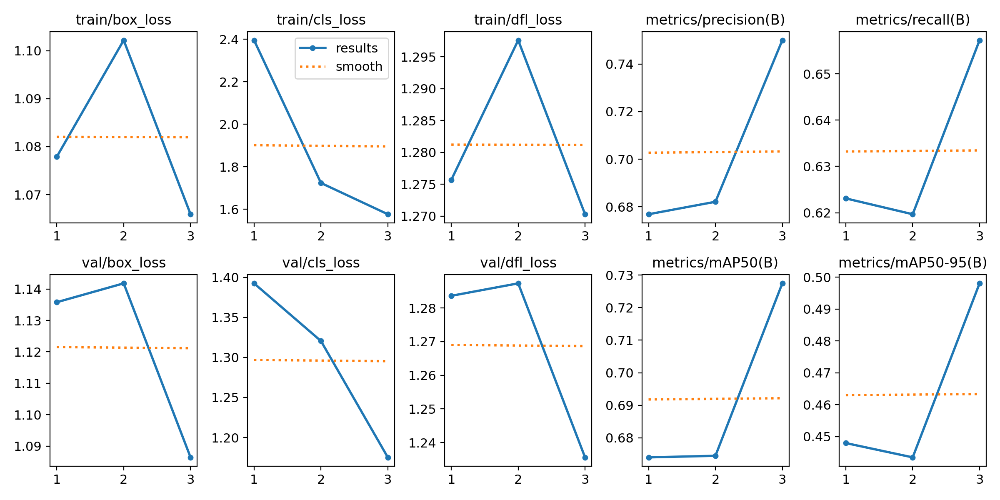

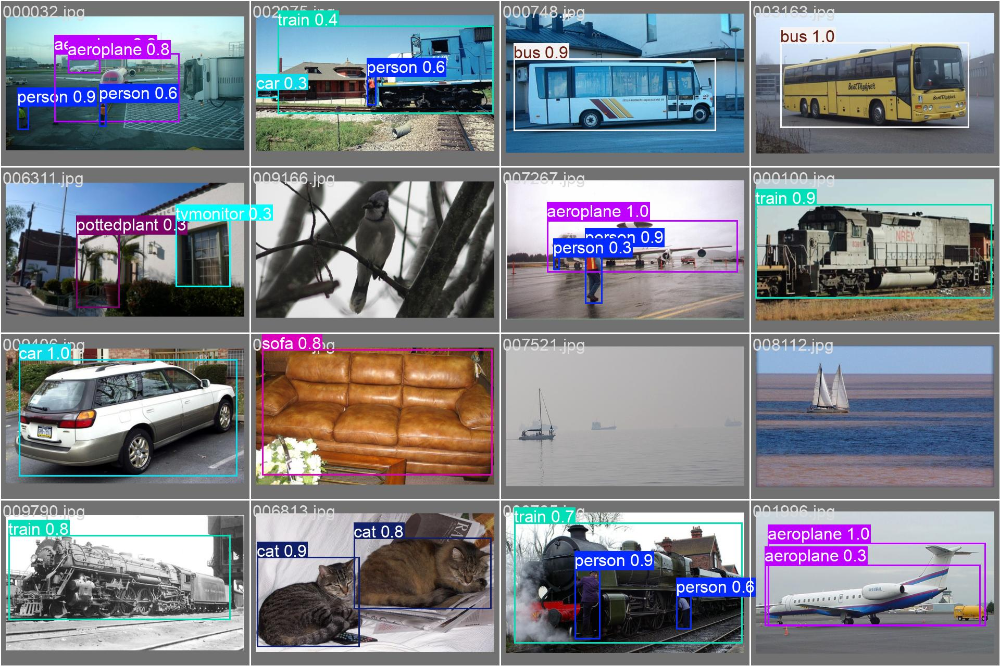

# Semantic segmentation with deeplabv3

#### Model
- deeplabv3_resnet50 with deeplabv3.DeepLabHead as decoder classifier

#### Dataset
- Camseq01 dataset (101 960x720 pixel image pairs)
- train 70%, val 15%, test 15%

#### Input
a batch (size 2) of 3-channel images

#### Output
a batch (size 2) of image segmentations

#### Metrics
- accuracy
- loss: cross-entropy loss

## Process
- download the dataset and preprocess
- create `class CamSeqDataset(torch.utils.data.Dataset)` to change image -> array, convert RGB mask to class-pixel mask, normalize, and put data in `torch.utils.data.DataLoader`
- create `class deeplabv3(pl.LightningModule)`
- train, save checkpoint, and test like before

## Results
see image below

In [ ]:
# download the dataset 
! wget https://github.com/pvateekul/2110531_DSDE_2023s1/raw/main/code/Week05_Intro_Deep_Learning/data/Camseq_2007.zip
! unzip -FF Camseq_2007.zip

In [ ]:
# load color map
colormap = OrderedDict()
with open("./Camseq_2007/label_colors.txt",'r') as f:
    for line in f:
        r,g,b,cls = line.split()
        colormap[cls] = [int(e) for e in [r,g,b]]

```
  'Animal': [64, 128, 64],
  'Archway': [192, 0, 128],
  'Bicyclist': [0, 128, 192],
  'Bridge': [0, 128, 64],
  'Building': [128, 0, 0],
  'Car': [64, 0, 128],
  'CartLuggagePram': [64, 0, 192],
  'Child': [192, 128, 64],
```

In [ ]:
class CamSeqDataset(Dataset):
    def __init__(self,
                 img_dir,
                 colormap=colormap,
                 transforms=None):

        super().__init__()
        # sort order of frame from video sequence
        self.images = sorted([os.path.join(img_dir, e)
                              for e in os.listdir(img_dir)
                              if not e.split('.')[0].endswith('_L')])
        # remove text files
        self.images = [e for e in self.images if not e.endswith('.txt')]
        self.masks = sorted([os.path.join(img_dir, e)
                              for e in os.listdir(img_dir)
                              if e.split('.')[0].endswith('_L')])
        self.colormap = colormap
        self.num_classes = len(self.colormap) # 32 classes
        self.transforms = transforms

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):

        img = Image.open(self.images[idx])
        mask = Image.open(self.masks[idx])

        if img.mode != 'RGB':
            img = img.convert('RGB')
        if mask.mode != 'RGB':
            mask = mask.convert('RGB')

        img = np.asarray(img) # change from image to array
        mask = np.asarray(mask)
        mask_channels = np.zeros(
            (mask.shape[0], mask.shape[1]), dtype=np.int64)

        # convert RGB mask to class-pixel mask ; (R,G,B) -> (Class)
        for i, cls in enumerate(self.colormap.keys()):
            color = self.colormap[cls]
            sub_mask = np.all(mask==color, axis=-1)*i
            mask_channels += sub_mask #*i

        # transforms such as normalization
        if self.transforms is not None:
            transformed = self.transforms(image=img, masks=mask_channels)
            img = transformed['image']
            mask_channels = transformed['masks']

        mask_channels = mask_channels.astype(np.float32)
        img = img.astype(np.float32) #/255

        instance = {'image': torch.from_numpy(img.transpose(2,0,1)),
                    'mask': torch.from_numpy(mask_channels)}

        return instance

    def ___first__(self):
        return self.__getitem__[0]

In [ ]:
import albumentations as A
transform = A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))

dataset = CamSeqDataset(img_dir='./Camseq_2007', colormap=colormap,transforms=transform)
# we split train/val/test -> 70/15/15
train_size = int(len(dataset)*0.7)
val_size = (len(dataset)-train_size)//2
# We do not use random split because the dataset is extracted from a video sequence, so nearly every frame looks the same.
train_set = Subset(dataset, range(train_size))
val_set = Subset(dataset, range(train_size, train_size + val_size))
test_set = Subset(dataset, range(train_size + val_size, len(dataset)))

batch_size = 2
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

In [ ]:
class deeplabv3(pl.LightningModule):
    def __init__(self, out_channels=32):
        super().__init__()
        # Load model
        self.model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
    # decoder head
        self.model.classifier = torchvision.models.segmentation.deeplabv3.DeepLabHead(
                                2048, num_classes=out_channels)
        self.model.to(device)
        self.criterion = nn.CrossEntropyLoss()
        self.learning_rate = 0.0002
        self.train_metrics = []
        self.val_metrics = []

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        inputs = batch['image'].to(device)
        masks = batch['mask'].to(device)

        outputs = self.model(inputs)
        y_pred = outputs['out']
        y_true = masks
        loss = self.criterion(y_pred.float(), y_true.long())
        acc = (torch.argmax(y_pred, 1) == y_true).float().mean()

        # Log metrics
        self.log("train_loss", loss, on_step=True, on_epoch=True, prog_bar=True)
        self.log("train_acc", acc, on_step=True, on_epoch=True, prog_bar=True)
        return loss

    def on_train_epoch_end(self):
        # Collect epoch metrics
        train_loss = self.trainer.callback_metrics["train_loss"]
        train_acc = self.trainer.callback_metrics["train_acc"]
        self.train_metrics.append(
            {
                "epoch": self.current_epoch,
                "train_loss": train_loss.item(),
                "train_acc": train_acc.item(),
            }
        )

    def validation_step(self, batch, batch_idx):
        inputs = batch['image'].to(device)
        masks = batch['mask'].to(device)
        with torch.no_grad():
            outputs = self.model(inputs)
        y_pred = outputs['out']
        y_true = masks
        loss = self.criterion(y_pred.float(), y_true.long())
        # acc using pixel accuracy. (it is easy to understand,but no way the best metric)
        # learn more https://towardsdatascience.com/metrics-to-evaluate-your-semantic-segmentation-model-6bcb99639aa2
        acc = (torch.argmax(y_pred, 1) == y_true).float().mean()

        self.log("val_loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        self.log("val_acc", acc, on_step=False, on_epoch=True, prog_bar=True)

    def on_validation_epoch_end(self):
        # Update validation metrics
        val_loss = self.trainer.callback_metrics["val_loss"]
        val_acc = self.trainer.callback_metrics["val_acc"]
        self.val_metrics.append(
            {
                "val_loss": val_loss.item(),
                "val_acc": val_acc.item(),
            }
        )

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return optimizer

net = deeplabv3(out_channels=32).to(device)
# then checkpoint_callback, trainer, plot loss/acc code, test, same as before

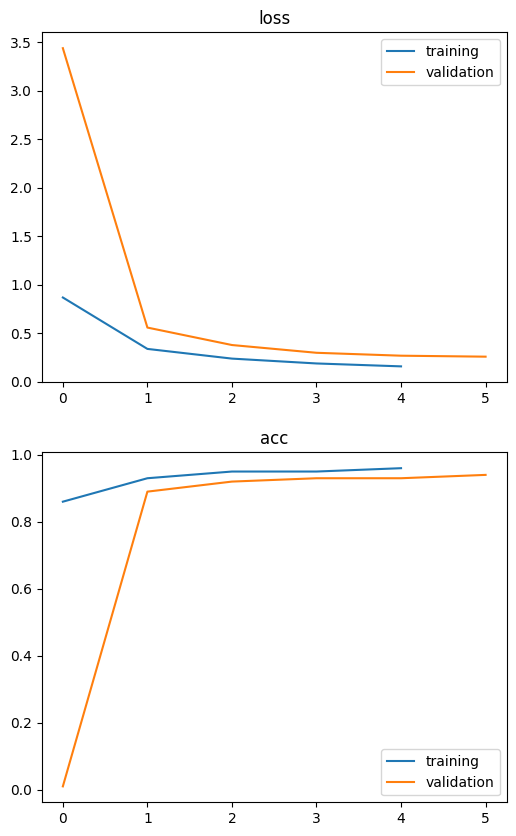

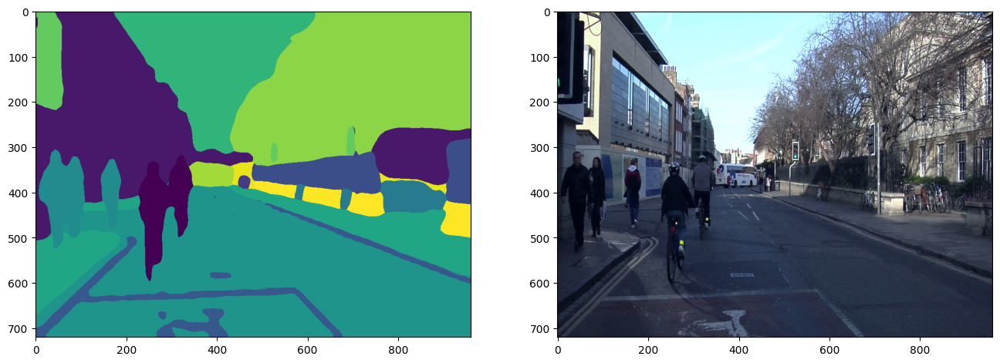

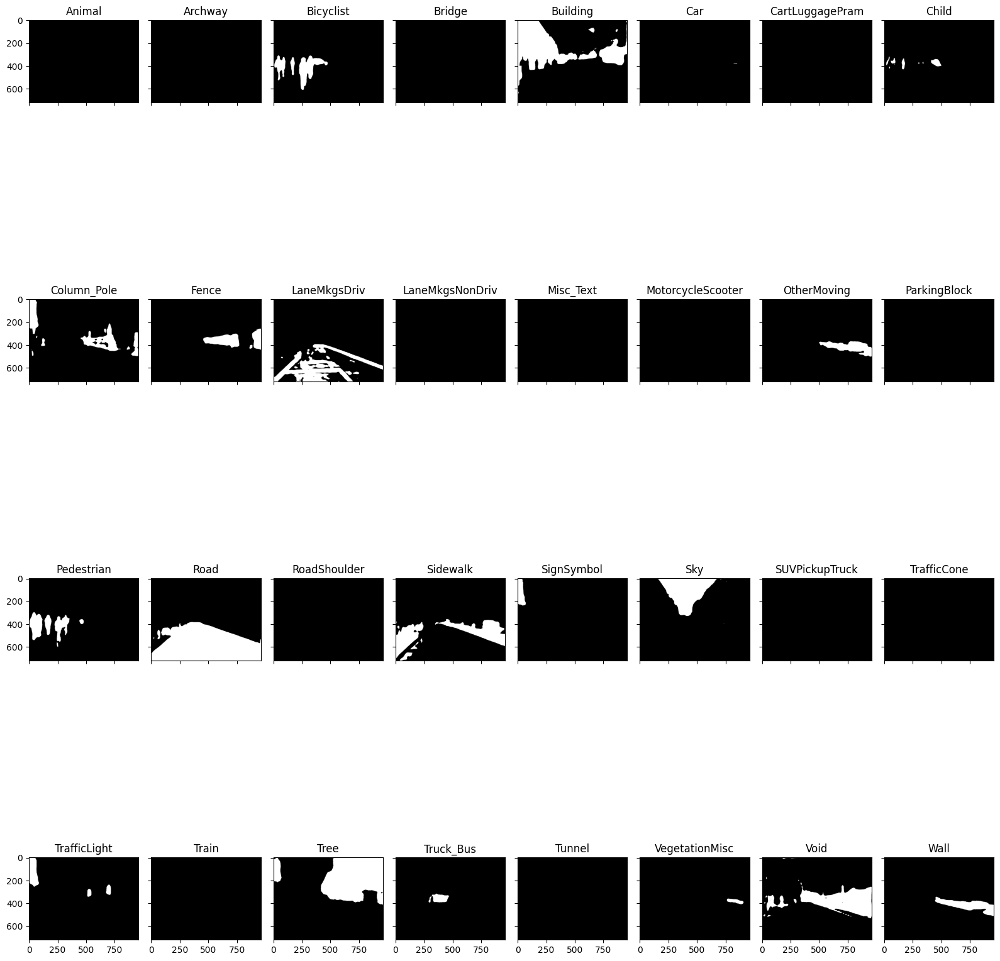